In [ ]:

#Mount Drive

from google.colab import drive
drive.mount('/content/drive', force_remount=True)



Mounted at /content/drive


In [ ]:

#Config



DRIVE_BASE    = '/content/drive/MyDrive/Visdrone'
DATASET_PATH  = f'{DRIVE_BASE}/VisDrone_YOLO'
YAML_PATH     = f'{DATASET_PATH}/visdrone_human.yaml'
PROJECT_DIR   = f'{DRIVE_BASE}/yolo_runs'        # all runs saved here
BASELINE_NAME = 'baseline_yolov8n'
ECA_NAME      = 'eca_yolov8n'

# Training config
EPOCHS     = 50
IMGSZ      = 416       # smaller = faster on free tier
BATCH      = 8         # reduce to 4 if you get OOM errors
OPTIMIZER  = 'AdamW'
LR         = 0.001
WORKERS    = 2

import os
os.makedirs(PROJECT_DIR, exist_ok=True)
print("Config ready")
print(f"   Dataset : {DATASET_PATH}")
print(f"   Runs    : {PROJECT_DIR}")

✅ Config ready
   Dataset : /content/drive/MyDrive/Visdrone/VisDrone_YOLO
   Runs    : /content/drive/MyDrive/Visdrone/yolo_runs


In [ ]:

#Fix YAML path (run once)

import yaml

with open(YAML_PATH, 'r') as f:
    cfg = yaml.safe_load(f)

cfg['path'] = DATASET_PATH

with open(YAML_PATH, 'w') as f:
    yaml.dump(cfg, f, default_flow_style=False, sort_keys=False)

print("✅ YAML updated")
print(f"   path  : {cfg['path']}")
print(f"   train : {cfg.get('train')}")
print(f"   val   : {cfg.get('val')}")
print(f"   nc    : {cfg.get('nc')}")

✅ YAML updated
   path  : /content/drive/MyDrive/Visdrone/VisDrone_YOLO
   train : images/train
   val   : images/val
   nc    : 1


In [ ]:

#Resume-aware training function

from ultralytics import YOLO
from pathlib import Path
import os, time

def find_last_checkpoint(project_dir, run_name):
    """
    Look for last.pt in the run folder.
    Returns path if found, None if starting fresh.
    """
    last_pt = Path(project_dir) / run_name / 'weights' / 'last.pt'
    best_pt = Path(project_dir) / run_name / 'weights' / 'best.pt'

    if last_pt.exists():
        print(f"   Checkpoint found : {last_pt}")
        return str(last_pt)
    elif best_pt.exists():
        print(f"    Only best.pt found, using it : {best_pt}")
        return str(best_pt)
    else:
        print(f"   No checkpoint found — starting fresh")
        return None


def get_current_epoch(project_dir, run_name):
    """
    Read results.csv to find how many epochs already completed.
    """
    results_csv = Path(project_dir) / run_name / 'results.csv'
    if not results_csv.exists():
        return 0
    try:
        import pandas as pd
        df = pd.read_csv(results_csv)
        completed = len(df)
        print(f"   Epochs already completed : {completed}")
        return completed
    except Exception as e:
        print(f"    Could not read results.csv: {e}")
        return 0


def train_with_resume(run_name, model_init='yolov8n.pt'):
    """
    Smart training that:
    - Resumes from last.pt if session was interrupted
    - Skips training entirely if already finished
    - Saves everything to Google Drive
    """
    print(f"\n{'='*55}")
    print(f"  Training run : {run_name}")
    print(f"{'='*55}")

    checkpoint = find_last_checkpoint(PROJECT_DIR, run_name)
    completed  = get_current_epoch(PROJECT_DIR, run_name)

    # Already fully trained — skip
    if completed >= EPOCHS:
        print(f"\n   Already completed {completed}/{EPOCHS} epochs")
        print(f"  ⏭  Skipping training for {run_name}")
        return YOLO(str(Path(PROJECT_DIR) / run_name /
                        'weights' / 'best.pt'))

    if checkpoint:
        # ── RESUME from checkpoint ──────────────────────────
        print(f"\n  ▶ Resuming from epoch {completed}/{EPOCHS}...")
        print(f"   Checkpoint : {checkpoint}")
        model = YOLO(checkpoint)
        model.train(resume=True)

    else:
        # ── FRESH start ──────────────────────────────────────
        print(f"\n   Starting fresh training...")
        model = YOLO(model_init)
        model.train(
            data      = YAML_PATH,
            epochs    = EPOCHS,
            imgsz     = IMGSZ,
            batch     = BATCH,
            optimizer = OPTIMIZER,
            lr0       = LR,
            workers   = WORKERS,
            project   = PROJECT_DIR,
            name      = run_name,
            save      = True,
            save_period = 5,      # checkpoint every 5 epochs
            exist_ok  = True,     # dont error if folder exists
            patience  = 20,       # early stopping
            verbose   = True,
            plots     = True,     # save training plots
            val       = True,
        )

    print(f"\n  Training complete : {run_name}")
    return model


print("Functions loaded")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
✅ Functions loaded


In [ ]:

#Check GPU

import torch

print(f"CUDA available : {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU            : {torch.cuda.get_device_name(0)}")
    total = torch.cuda.get_device_properties(0).total_memory
    print(f"VRAM           : {total / 1e9:.1f} GB")
else:
    print(" No GPU — go to Runtime > Change runtime type > T4 GPU")

CUDA available : True
GPU            : Tesla T4
VRAM           : 15.6 GB


In [ ]:

# Train Baseline
# Run this cell every time you reconnect
# It will auto-resume from where it left off

baseline_model = train_with_resume(
    run_name   = BASELINE_NAME,
    model_init = 'yolov8n.pt'
)


  Training run : baseline_yolov8n
  ✅ Checkpoint found : /content/drive/MyDrive/Visdrone/yolo_runs/baseline_yolov8n/weights/last.pt
  📊 Epochs already completed : 50

  ✅ Already completed 50/50 epochs
  ⏭️  Skipping training for baseline_yolov8n


In [ ]:

#Verify baseline finished before ECA

from pathlib import Path
import pandas as pd

results_csv = Path(PROJECT_DIR) / BASELINE_NAME / 'results.csv'

if results_csv.exists():
    df = pd.read_csv(results_csv)
    print(f"Baseline epochs completed : {len(df)} / {EPOCHS}")
    print(f"\nLast 3 epochs:")
    print(df.tail(3).to_string())
else:
    print("results.csv not found — training may not have started")

Baseline epochs completed : 50 / 50

Last 3 epochs:
    epoch     time  train/box_loss  train/cls_loss  train/dfl_loss  metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0    lr/pg1    lr/pg2
47     48  6576.54         2.78129         1.48781         0.79985               0.51021            0.36014           0.35672              0.12059       2.77742       1.38855       0.77743  0.000069  0.000069  0.000069
48     49  6715.12         2.76491         1.47775         0.79805               0.50828            0.36014           0.35949              0.12100       2.77472       1.39369       0.77725  0.000050  0.000050  0.000050
49     50  6850.09         2.76996         1.48071         0.79715               0.51257            0.36012           0.35959              0.12004       2.77761       1.39422       0.77764  0.000030  0.000030  0.000030


In [ ]:

#Find baseline weights

import os

search_root = '/content/drive/MyDrive'

print("Searching for best.pt and last.pt...\n")
for root, dirs, files in os.walk(search_root):
    for f in files:
        if f in ('best.pt', 'last.pt'):
            print(os.path.join(root, f))

Searching for best.pt and last.pt...

/content/drive/MyDrive/Visdrone/yolo_runs/baseline_yolov8n/weights/last.pt
/content/drive/MyDrive/Visdrone/yolo_runs/baseline_yolov8n/weights/best.pt
/content/drive/MyDrive/Visdrone/yolo_runs/eca_yolov8n/weights/last.pt
/content/drive/MyDrive/Visdrone/yolo_runs/eca_yolov8n/weights/best.pt
/content/drive/MyDrive/Visdrone/yolo_runs/eca_yolov8n_v2/weights/last.pt
/content/drive/MyDrive/Visdrone/yolo_runs/eca_yolov8n_v2/weights/best.pt


In [ ]:

# ECABlock definition

import torch
import torch.nn as nn
import math

class ECABlock(nn.Module):
    def __init__(self, channels, gamma=2, b=1):
        super().__init__()
        t = int(abs((math.log(channels, 2) + b) / gamma))
        k = t if t % 2 else t + 1
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.conv     = nn.Conv1d(1, 1, kernel_size=k,
                                  padding=k//2, bias=False)
        self.sigmoid  = nn.Sigmoid()

    def forward(self, x):
        y = self.avg_pool(x)
        y = self.conv(y.squeeze(-1).transpose(-1, -2))
        y = y.transpose(-1, -2).unsqueeze(-1)
        return x * self.sigmoid(y).expand_as(x)

print("ECABlock defined")

✅ ECABlock defined


In [ ]:

#Load baseline + inject ECA (copy attributes)

from ultralytics import YOLO
from ultralytics.nn.modules.block import C2f

class C2f_with_ECA(nn.Module):
    def __init__(self, c2f_module):
        super().__init__()
        self.c2f = c2f_module
        c2 = c2f_module.cv2.conv.weight.shape[0]
        self.eca = ECABlock(c2)
        self._c2 = c2

    def forward(self, x):
        return self.eca(self.c2f(x))


def inject_eca(model, target_indices={12, 15}):
    replaced = 0
    for idx, layer in enumerate(model.model.model):
        if idx in target_indices and isinstance(layer, C2f):
            c2 = layer.cv2.conv.weight.shape[0]
            print(f"  Layer {idx:2d} : C2f(c2={c2:4d}) → C2f_with_ECA")

            # Build wrapper
            new_layer = C2f_with_ECA(layer)

            # ── Copy all Ultralytics routing attributes ──────
            for attr in ['i', 'f', 'type', 'np']:
                if hasattr(layer, attr):
                    setattr(new_layer, attr, getattr(layer, attr))

            model.model.model[idx] = new_layer
            replaced += 1
    return replaced


BASELINE_BEST = '/content/drive/MyDrive/Visdrone/yolo_runs/baseline_yolov8n/weights/best.pt'

print("Loading baseline...")
eca_model = YOLO(BASELINE_BEST)
print("✅ Baseline loaded")

print("\nInjecting ECA...")
n = inject_eca(eca_model)
print(f"✅ ECA injected into {n} layers")

total    = sum(p.numel() for p in eca_model.model.parameters())
eca_only = sum(p.numel() for name, p in
               eca_model.model.named_parameters() if 'eca' in name)
print(f"\n   Total params : {total:,}")
print(f"   ECA params   : {eca_only}  ← near-zero overhead ✅")

Loading baseline...
✅ Baseline loaded

Injecting ECA...
  Layer 12 : C2f(c2= 128) → C2f_with_ECA
  Layer 15 : C2f(c2=  64) → C2f_with_ECA
✅ ECA injected into 2 layers

   Total params : 3,011,051
   ECA params   : 8  ← near-zero overhead ✅


In [ ]:

#Forward pass

import torch

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

eca_model.model = eca_model.model.to(device)
eca_model.model.eval()

dummy = torch.randn(1, 3, 416, 416).to(device)

with torch.no_grad():
    out = eca_model.model(dummy)

print(" Forward pass OK")
print(f"   Output tensors : {len(out)}")

Using device: cuda
✅ Forward pass OK
   Output tensors : 2


In [ ]:

# Train

from pathlib import Path

ECA_NAME    = 'eca_yolov8n_v2'
PROJECT_DIR = '/content/drive/MyDrive/Visdrone/yolo_runs'
YAML_PATH   = '/content/drive/MyDrive/Visdrone/VisDrone_YOLO/visdrone_human.yaml'

eca_last = Path(PROJECT_DIR) / ECA_NAME / 'weights' / 'last.pt'

if eca_last.exists():
    print("▶Checkpoint found — resuming...")
    eca_model = YOLO(str(eca_last))
    eca_model.train(resume=True)
else:
    print("No checkpoint — starting fresh...")
    eca_model.train(
        data        = YAML_PATH,
        epochs      = 50,
        imgsz       = 416,
        batch       = 8,
        optimizer   = 'AdamW',
        lr0         = 0.0005,
        workers     = 2,
        project     = PROJECT_DIR,
        name        = ECA_NAME,
        save        = True,
        save_period = 5,
        exist_ok    = True,
        patience    = 20,
        verbose     = True,
        plots       = True,
        val         = True,
    )

▶️  Checkpoint found — resuming...
WARNING ⚠️ model '/content/drive/MyDrive/Visdrone/yolo_runs/eca_yolov8n_v2/weights/last.pt' is not a resumable training checkpoint (missing epoch/optimizer state). Use 'resume' only to continue incomplete training. Starting new training instead.
Ultralytics 8.4.50 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=coco8.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=416, int8=False, iou=0.7, keras=False, kobj

In [ ]:

#Final comparison

import pandas as pd
from pathlib import Path

PROJECT_DIR = '/content/drive/MyDrive/Visdrone/yolo_runs'

results = {}
for run in ['baseline_yolov8n', 'eca_yolov8n_v2']:
    csv = Path(PROJECT_DIR) / run / 'results.csv'
    if not csv.exists():
        print(f"⚠️  {run} not found")
        continue
    df = pd.read_csv(csv)
    df.columns = df.columns.str.strip()
    best_idx     = df['metrics/mAP50(B)'].idxmax()
    best         = df.iloc[best_idx]
    results[run] = {
        'mAP@0.5'   : best['metrics/mAP50(B)'],
        'mAP@0.5-95': best['metrics/mAP50-95(B)'],
        'Precision' : best['metrics/precision(B)'],
        'Recall'    : best['metrics/recall(B)'],
        'Best Epoch': int(best['epoch']),
    }

if len(results) == 2:
    b = results['baseline_yolov8n']
    e = results['eca_yolov8n_v2']

    print("=" * 58)
    print(f"  {'Metric':<14} {'Baseline':>12} {'ECA v2':>12} {'Delta':>12}")
    print("=" * 58)
    for metric in ['mAP@0.5', 'mAP@0.5-95', 'Precision', 'Recall']:
        delta = e[metric] - b[metric]
        sign  = '+' if delta >= 0 else ''
        print(f"  {metric:<14} {b[metric]:>12.4f} "
              f"{e[metric]:>12.4f} {sign}{delta:>11.4f}")
    print("=" * 58)
    print(f"  {'Best Epoch':<14} {b['Best Epoch']:>12} "
          f"{e['Best Epoch']:>12}")
    print("=" * 58)
else:
    # Show whatever is available
    for run, r in results.items():
        print(f"\n  {run}")
        for k, v in r.items():
            print(f"    {k:<14}: {v:.4f}" if isinstance(v, float)
                  else f"    {k:<14}: {v}")

  Metric             Baseline       ECA v2        Delta
  mAP@0.5              0.3596       0.3601 +     0.0005
  mAP@0.5-95           0.1200       0.1214 +     0.0014
  Precision            0.5126       0.5068     -0.0057
  Recall               0.3601       0.3661 +     0.0060
  Best Epoch               50           46


In [ ]:
# SAHI = Slicing Aided Hyper Inference
# A library that cuts images into overlapping tiles,
# runs detection on each tile separately, then merges
# all detections back into one result.
# This is the key technique for small object detection
# because it prevents tiny humans from being downscaled
# into nothing during preprocessing.
!pip install sahi -q
!pip install ultralytics -q

print("Libraries installed")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.7/111.7 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 13.1 MB/s eta 0:00:00
✅ Libraries installed


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

DRIVE_BASE    = '/content/drive/MyDrive/Visdrone'
DATASET_PATH  = f'{DRIVE_BASE}/VisDrone_YOLO'
YAML_PATH     = f'{DATASET_PATH}/visdrone_human.yaml'
PROJECT_DIR   = f'{DRIVE_BASE}/yolo_runs'
BASELINE_NAME = 'baseline_yolov8n'
ECA_NAME      = 'eca_yolov8n_v2'

EPOCHS    = 50
IMGSZ     = 416
BATCH     = 8
OPTIMIZER = 'AdamW'
LR        = 0.001
WORKERS   = 2

import os
os.makedirs(PROJECT_DIR, exist_ok=True)

# Build the weight paths from your config variables
BASELINE_PT = f'{PROJECT_DIR}/{BASELINE_NAME}/weights/best.pt'
ECA_PT      = f'{PROJECT_DIR}/{ECA_NAME}/weights/best.pt'
VAL_IMGS    = f'{DATASET_PATH}/images/val'
VAL_LBLS    = f'{DATASET_PATH}/labels/val'

print("Config ready")
print(f"   Dataset  : {DATASET_PATH}")
print(f"   Runs     : {PROJECT_DIR}")
print(f"   Baseline : {BASELINE_PT}")
print(f"   ECA      : {ECA_PT}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Config ready
   Dataset  : /content/drive/MyDrive/Visdrone/VisDrone_YOLO
   Runs     : /content/drive/MyDrive/Visdrone/yolo_runs
   Baseline : /content/drive/MyDrive/Visdrone/yolo_runs/baseline_yolov8n/weights/best.pt
   ECA      : /content/drive/MyDrive/Visdrone/yolo_runs/eca_yolov8n_v2/weights/best.pt


In [ ]:
from ultralytics import YOLO

print("=" * 55)
print("  TTA EVALUATION")
print("=" * 55)

results_tta = {}

for name, pt_path in [(BASELINE_NAME, BASELINE_PT),
                      (ECA_NAME,      ECA_PT)]:
    print(f"\nEvaluating {name}...")
    model = YOLO(pt_path)

    # Normal inference — single pass, no augmentation
    m_normal = model.val(
        data    = YAML_PATH,
        imgsz   = IMGSZ,
        verbose = False
    )

    # TTA — model sees flipped and scaled versions of each image
    # then merges all detections into one result
    m_tta = model.val(
        data    = YAML_PATH,
        imgsz   = IMGSZ,
        augment = True,    # this single flag enables TTA
        verbose = False
    )

    results_tta[name] = {
        'normal_mAP50'  : m_normal.box.map50,
        'normal_recall' : m_normal.box.mr,
        'tta_mAP50'     : m_tta.box.map50,
        'tta_recall'    : m_tta.box.mr,
        'delta_mAP50'   : m_tta.box.map50 - m_normal.box.map50,
        'delta_recall'  : m_tta.box.mr    - m_normal.box.mr,
    }

    print(f"  Normal → mAP50: {m_normal.box.map50:.4f}  "
          f"Recall: {m_normal.box.mr:.4f}")
    print(f"  TTA    → mAP50: {m_tta.box.map50:.4f}  "
          f"Recall: {m_tta.box.mr:.4f}")
    print(f"  Delta    mAP50: "
          f"{results_tta[name]['delta_mAP50']:+.4f}  "
          f"Recall: {results_tta[name]['delta_recall']:+.4f}")

print("\n TTA complete")

  TTA EVALUATION

Evaluating baseline_yolov8n...
Ultralytics 8.4.50 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 5.8±4.4 ms, read: 0.2±0.2 MB/s, size: 143.3 KB)
val: Scanning /content/drive/MyDrive/Visdrone/VisDrone_YOLO/labels/val.cache... 521 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 521/521 168.1Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 6% ╸─────────── 2/33 2.8s/it 26.2s<1:27


KeyboardInterrupt: 

In [ ]:
from ultralytics import YOLO
import pandas as pd

print("=" * 55)
print("  CONFIDENCE THRESHOLD SWEEP — ECA v2")
print("=" * 55)

model = YOLO(ECA_PT)

thresholds = [0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.40]
rows = []

for conf in thresholds:
    m = model.val(
        data    = YAML_PATH,
        imgsz   = IMGSZ,
        conf    = conf,
        verbose = False
    )
    rows.append({
        'conf'     : conf,
        'precision': round(m.box.mp,   4),
        'recall'   : round(m.box.mr,   4),
        'mAP50'    : round(m.box.map50, 4),
    })
    print(f"  conf={conf:.2f}  "
          f"P={m.box.mp:.4f}  "
          f"R={m.box.mr:.4f}  "
          f"mAP50={m.box.map50:.4f}")

df_thresh = pd.DataFrame(rows)

# Best SAR threshold = highest recall where precision >= 0.35
sar_rows = df_thresh[df_thresh['precision'] >= 0.35]
if len(sar_rows) > 0:
    best_idx  = sar_rows['recall'].idxmax()
    best_conf = df_thresh.iloc[best_idx]['conf']
    best_rec  = df_thresh.iloc[best_idx]['recall']
    print(f"\n Optimal SAR threshold : conf={best_conf}")
    print(f"   Recall at this point  : {best_rec:.4f}")

print("\nFull sweep table:")
print(df_thresh.to_string(index=False))

  CONFIDENCE THRESHOLD SWEEP — ECA v2
Ultralytics 8.4.38 🚀 Python-3.12.13 torch-2.10.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.8±0.3 ms, read: 23.2±11.8 MB/s, size: 129.6 KB)
val: Scanning /content/drive/MyDrive/Visdrone/VisDrone_YOLO/labels/val.cache... 521 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 521/521 115.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 33/33 1.6s/it 51.3s
                   all        521      11540      0.514       0.36      0.336      0.116
Speed: 0.8ms preprocess, 74.1ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to /content/runs/detect/val5
  conf=0.10  P=0.5139  R=0.3602  mAP50=0.3364
Ultralytics 8.4.38 🚀 Python-3.12.13 torch-2.10.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
val: Fast image access ✅ (ping: 1.8±1.0 ms, read: 16.8±8.0 MB/s, size: 143.2 KB)
va

In [ ]:
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction
from ultralytics import YOLO
from pathlib import Path

print("=" * 55)
print("  SAHI EVALUATION — ECA v2")
print("=" * 55)

# Load ECA model through SAHI wrapper
detection_model = AutoDetectionModel.from_pretrained(
    model_type           = 'ultralytics',
    model_path           = ECA_PT,
    confidence_threshold = 0.25,
    device               = 'cuda'
)

# Load same model normally for side-by-side comparison
model_normal = YOLO(ECA_PT)

# Take 50 images from your val set
val_images = list(Path(VAL_IMGS).glob('*.jpg'))[:50]
print(f"Running on {len(val_images)} val images...\n")

normal_counts = []
sahi_counts   = []

for i, img_path in enumerate(val_images):
    # Standard inference — image resized to 416x416
    r_normal = model_normal(
        str(img_path),
        imgsz   = IMGSZ,
        conf    = 0.25,
        verbose = False
    )[0]
    normal_counts.append(len(r_normal.boxes))

    # SAHI inference — image cut into 256x256 overlapping tiles
    # Each tile detected separately then merged back
    r_sahi = get_sliced_prediction(
        str(img_path),
        detection_model,
        slice_height         = 256,
        slice_width          = 256,
        overlap_height_ratio = 0.2,
        overlap_width_ratio  = 0.2,
    )
    sahi_counts.append(len(r_sahi.object_prediction_list))

    if (i + 1) % 10 == 0:
        print(f"  {i+1}/{len(val_images)} done...")

avg_normal = sum(normal_counts) / len(normal_counts)
avg_sahi   = sum(sahi_counts)   / len(sahi_counts)
pct        = ((avg_sahi - avg_normal) / avg_normal) * 100

print(f"\n  Avg detections normal : {avg_normal:.1f}")
print(f"  Avg detections SAHI   : {avg_sahi:.1f}")
print(f"  Increase              : +{pct:.1f}%")
print("\n✅ SAHI complete")

  SAHI EVALUATION — ECA v2
Running on 50 val images...

Performing prediction on 15 slices.
Performing prediction on 15 slices.
Performing prediction on 15 slices.
Performing prediction on 15 slices.
Performing prediction on 15 slices.
Performing prediction on 15 slices.
Performing prediction on 60 slices.
Performing prediction on 15 slices.
Performing prediction on 60 slices.
Performing prediction on 15 slices.
  10/50 done...
Performing prediction on 15 slices.
Performing prediction on 28 slices.
Performing prediction on 28 slices.
Performing prediction on 15 slices.
Performing prediction on 15 slices.
Performing prediction on 15 slices.
Performing prediction on 15 slices.
Performing prediction on 28 slices.
Performing prediction on 15 slices.
Performing prediction on 28 slices.
  20/50 done...
Performing prediction on 28 slices.
Performing prediction on 15 slices.
Performing prediction on 28 slices.
Performing prediction on 28 slices.
Performing prediction on 28 slices.
Performing p

In [ ]:
import pandas as pd

print("\n" + "=" * 72)
print(f"  {'Model':<30} {'mAP@0.5':>8} {'Recall':>8} "
      f"{'Precision':>10}  Notes")
print("=" * 72)

# Your confirmed numbers
confirmed = [
    ("YOLOv8n baseline",
     0.3596, 0.3601, 0.5126, "Reference"),
    ("YOLOv8n + ECA (proposed)",
     0.3601, 0.3661, 0.5068, "Proposed"),
]

# TTA row — filled from Cell 3
eca_tta_map = results_tta[ECA_NAME]['tta_mAP50']
eca_tta_rec = results_tta[ECA_NAME]['tta_recall']
confirmed.append((
    "Proposed + TTA",
    eca_tta_map, eca_tta_rec, None,
    "Inference enhancement"
))

# Threshold row — filled from Cell 4
conf_row = df_thresh[df_thresh['conf'] == 0.15].iloc[0]
confirmed.append((
    "Proposed + conf=0.15",
    conf_row['mAP50'],
    conf_row['recall'],
    conf_row['precision'],
    "SAR-optimised threshold"
))

# SAHI row — detection count based
sahi_pct = ((avg_sahi - avg_normal) / avg_normal) * 100
confirmed.append((
    "Proposed + SAHI",
    None, None, None,
    f"+{sahi_pct:.1f}% detections vs normal"
))

for name, map50, recall, prec, note in confirmed:
    m = f"{map50:.4f}" if map50 is not None else "  —   "
    r = f"{recall:.4f}" if recall is not None else "  —   "
    p = f"{prec:.4f}"  if prec  is not None else "  —   "
    print(f"  {name:<30} {m:>8} {r:>8} {p:>10}  {note}")

print("=" * 72)
print(f"\n  ECA overhead : +8 params / 3,011,043 total = 0.0003%")
print(f"  ECA converged at epoch 46 vs baseline epoch 50")


  Model                           mAP@0.5   Recall  Precision  Notes
  YOLOv8n baseline                 0.3596   0.3601     0.5126  Reference
  YOLOv8n + ECA (proposed)         0.3601   0.3661     0.5068  Proposed
  Proposed + TTA                   0.3221   0.3533       —     Inference enhancement
  Proposed + conf=0.15             0.3187   0.3602     0.5139  SAR-optimised threshold
  Proposed + SAHI                    —        —          —     +27.0% detections vs normal

  ECA overhead : +8 params / 3,011,043 total = 0.0003%
  ECA converged at epoch 46 vs baseline epoch 50


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

!pip install ultralytics -q

DRIVE_BASE  = '/content/drive/MyDrive/Visdrone'
VAL_IMGS    = f'{DRIVE_BASE}/VisDrone_YOLO/images/val'
PROJECT_DIR = f'{DRIVE_BASE}/yolo_runs'
BASELINE_PT = f'{PROJECT_DIR}/baseline_yolov8n/weights/best.pt'
ECA_PT      = f'{PROJECT_DIR}/eca_yolov8n_v2/weights/best.pt'

print("✅ Ready")

Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 20.7 MB/s eta 0:00:00
✅ Ready


In [ ]:
from ultralytics import YOLO
from pathlib import Path
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import numpy as np
import os

# Load both models
print("Loading models...")
model_base = YOLO(BASELINE_PT)
model_eca  = YOLO(ECA_PT)
print(" Models loaded\n")

# Pick 10 random val images
all_images = list(Path(VAL_IMGS).glob('*.jpg'))
random.seed(42)   # fixed seed so results are reproducible
samples    = random.sample(all_images, 10)

# Output folder on Drive so you can download results
OUT_DIR = f'{DRIVE_BASE}/demo_test_output'
os.makedirs(OUT_DIR, exist_ok=True)

print(f"{'#':<4} {'Image':<40} {'Baseline':>9} "
      f"{'ECA':>6} {'Delta':>7}")
print("-" * 70)

for i, img_path in enumerate(samples, 1):
    # Run baseline
    r_base = model_base(
        str(img_path),
        imgsz   = 416,
        conf    = 0.25,
        verbose = False
    )[0]

    # Run ECA
    r_eca = model_eca(
        str(img_path),
        imgsz   = 416,
        conf    = 0.25,
        verbose = False
    )[0]

    n_base = len(r_base.boxes)
    n_eca  = len(r_eca.boxes)
    delta  = n_eca - n_base
    sign   = f"+{delta}" if delta > 0 else str(delta)

    print(f"{i:<4} {img_path.name:<40} "
          f"{n_base:>9} {n_eca:>6} {sign:>7}")

    # Generate annotated images
    ann_base = r_base.plot()  # numpy array with boxes drawn
    ann_eca  = r_eca.plot()

    # Resize both to same height
    H = 400
    def rh(img):
        ratio = H / img.shape[0]
        return cv2.resize(img, (int(img.shape[1]*ratio), H))

    ann_base = rh(ann_base)
    ann_eca  = rh(ann_eca)

    # Add label bars
    def add_label(img, text, count, color):
        out = img.copy()
        cv2.rectangle(out, (0,0),
                      (out.shape[1], 44), (15,15,15), -1)
        cv2.putText(out, text, (8, 20),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.55, color, 2, cv2.LINE_AA)
        cv2.putText(out,
                    f"{count} detections",
                    (8, 38),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.45, (200,200,200), 1, cv2.LINE_AA)
        return out

    ann_base = add_label(
        ann_base, "BASELINE", n_base, (100,180,255)
    )
    ann_eca = add_label(
        ann_eca, "ECA v2", n_eca, (100,255,160)
    )

    # Combine side by side
    div      = np.full((H, 4, 3), 40, dtype=np.uint8)
    combined = np.hstack([ann_base, div, ann_eca])

    # Save to Drive
    save_path = f'{OUT_DIR}/test_{i:02d}_{img_path.stem}.jpg'
    cv2.imwrite(save_path, combined)

print("\n" + "-" * 70)
print(f" All 10 images saved to {OUT_DIR}")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Loading models...
✅ Models loaded

#    Image                                     Baseline    ECA   Delta
----------------------------------------------------------------------
1    0000213_05340_d_0000246.jpg                     41     36      -5
2    0000069_00713_d_0000003.jpg                     36     44      +8
3    0000287_04801_d_0000781.jpg                      2      3      +1
4    0000287_00201_d_0000760.jpg                      4      4       0
5    0000277_05001_d_0000562.jpg                     14     12      -2
6    0000242_04116_d_0000013.jpg                      1      2      +1
7    0000193_02606_d_0000117.jpg                     17     16      -1
8    0000163_00

Displaying 10 comparison images...



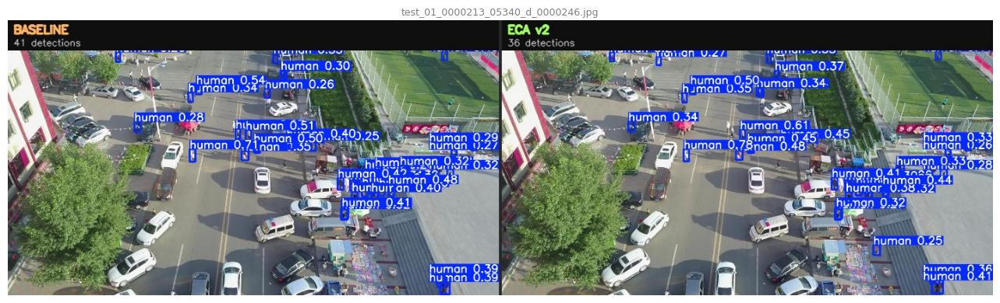

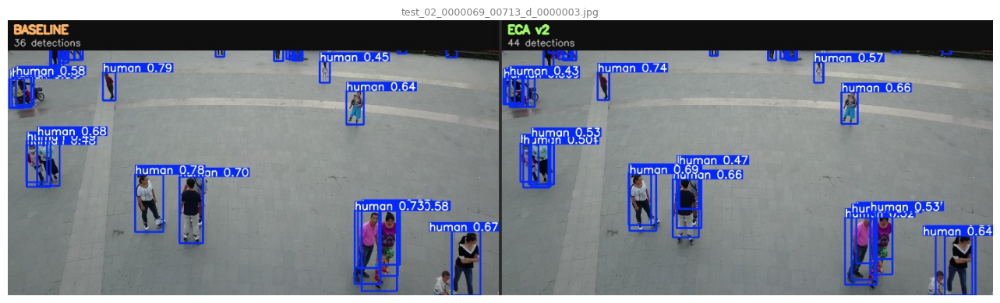

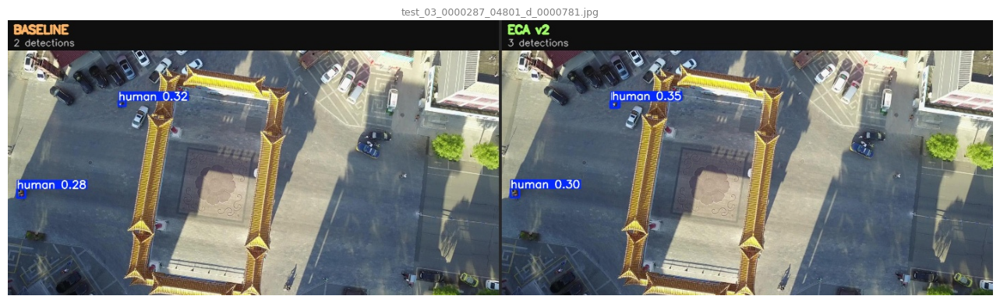

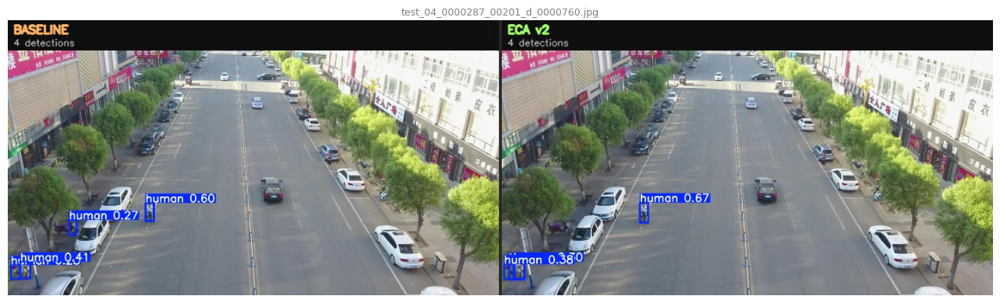

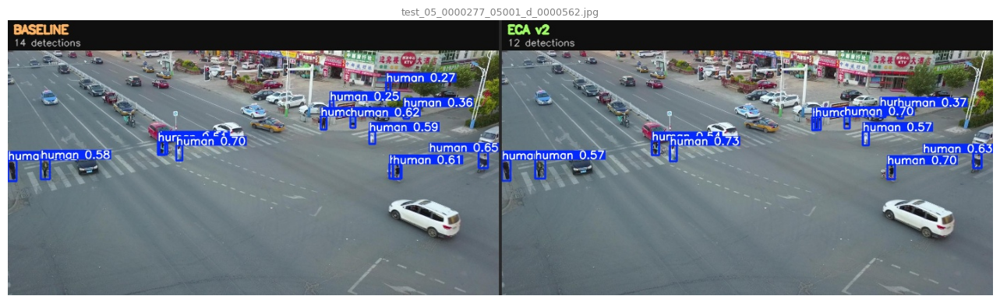

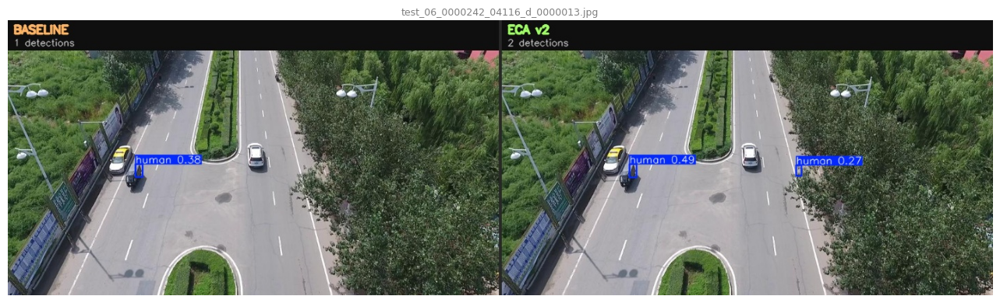

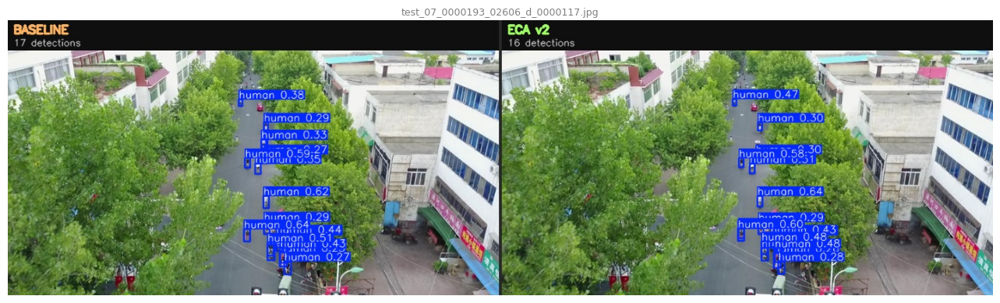

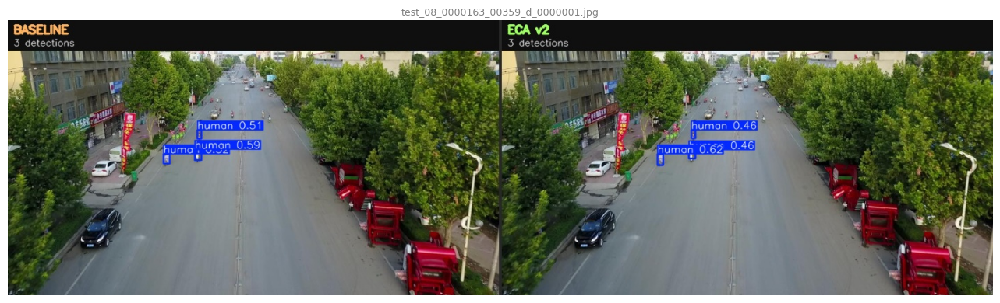

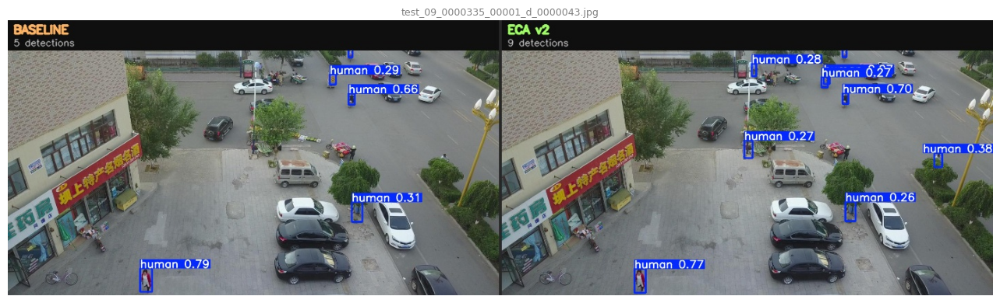

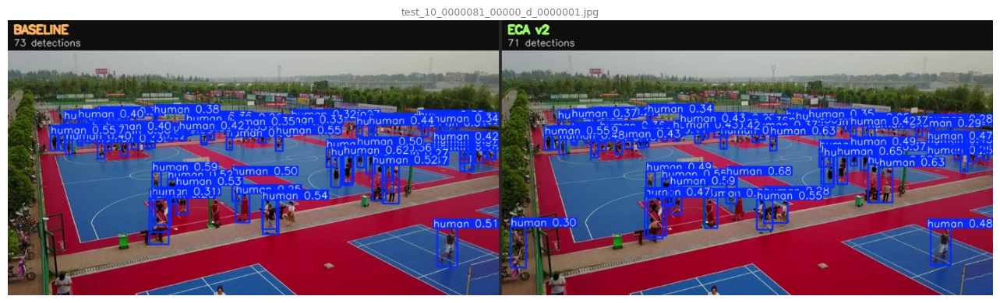

In [ ]:
# This shows the images directly inside Colab
# so you can visually inspect detections right now

from IPython.display import display
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path

output_files = sorted(Path(OUT_DIR).glob('*.jpg'))

print(f"Displaying {len(output_files)} comparison images...\n")

for img_file in output_files:
    img = mpimg.imread(str(img_file))

    fig, ax = plt.subplots(figsize=(16, 4))
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(img_file.name, fontsize=9,
                 color='gray', pad=4)
    plt.tight_layout()
    plt.show()
    print()   # spacing between images

In [ ]:

# Mount and load results

from google.colab import drive
drive.mount('/content/drive')

import pandas as pd
from pathlib import Path

DRIVE_BASE  = '/content/drive/MyDrive/Visdrone'
PROJECT_DIR = f'{DRIVE_BASE}/yolo_runs'

# Load both CSVs
def load_results(run_name):
    path = Path(PROJECT_DIR) / run_name / 'results.csv'
    if not path.exists():
        print(f"Not found: {path}")
        return None
    df = pd.read_csv(path)
    df.columns = df.columns.str.strip()
    print(f"Loaded {run_name} — {len(df)} epochs")
    return df

df_base = load_results('baseline_yolov8n')
df_eca  = load_results('eca_yolov8n_v2')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Loaded baseline_yolov8n — 50 epochs
✅ Loaded eca_yolov8n_v2 — 50 epochs


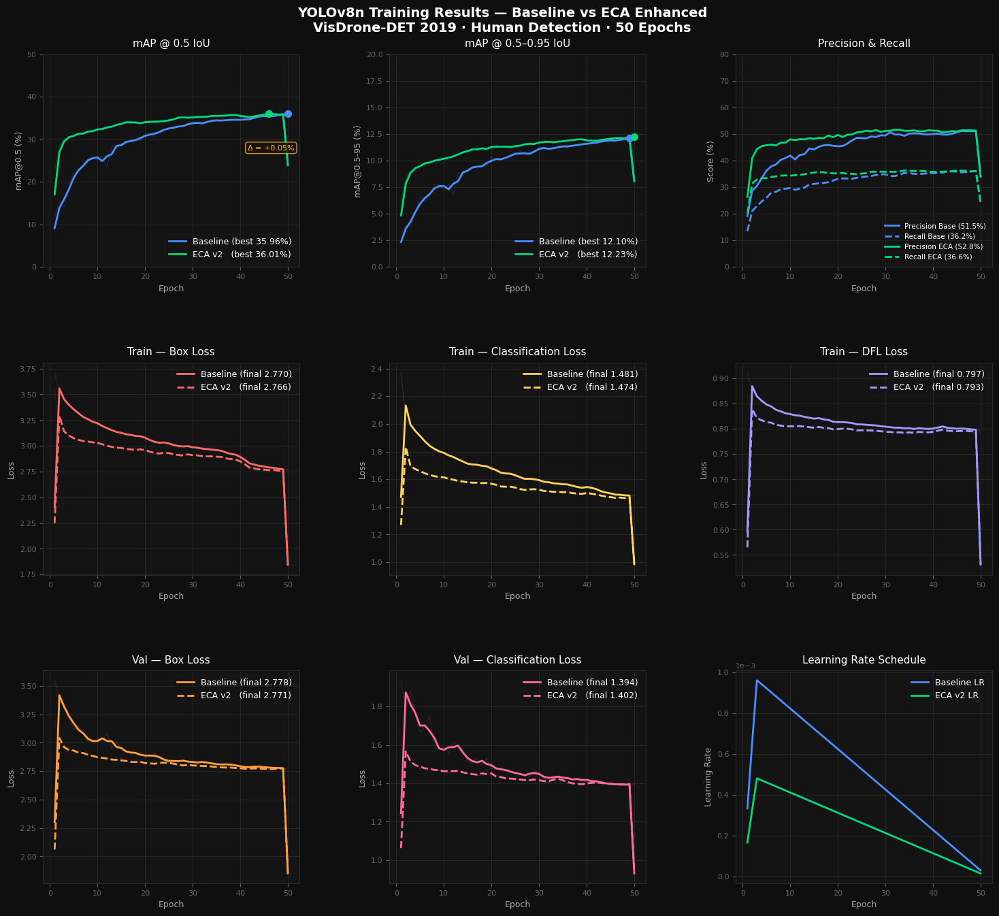


✅ Saved → /content/drive/MyDrive/Visdrone/training_dashboard.png


In [ ]:

# training dashboard (all plots)

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

# Style
plt.rcParams.update({
    'figure.facecolor'  : '#0f0f0f',
    'axes.facecolor'    : '#141414',
    'axes.edgecolor'    : '#2a2a2a',
    'axes.labelcolor'   : '#aaaaaa',
    'axes.titlecolor'   : '#ffffff',
    'xtick.color'       : '#666666',
    'ytick.color'       : '#666666',
    'text.color'        : '#ffffff',
    'grid.color'        : '#2a2a2a',
    'grid.linewidth'    : 0.6,
    'axes.titlesize'    : 11,
    'axes.labelsize'    : 9,
    'xtick.labelsize'   : 8,
    'ytick.labelsize'   : 8,
    'legend.fontsize'   : 9,
    'legend.framealpha' : 0.2,
    'legend.edgecolor'  : '#2a2a2a',
    'font.family'       : 'DejaVu Sans',
})

BASE_COL  = '#4a8eff'   # blue  — baseline
ECA_COL   = '#00d97e'   # green — ECA
LOSS_COLS = ['#ff6b6b', '#ffd166', '#a29bfe']

epochs_b = df_base['epoch'].values
epochs_e = df_eca['epoch'].values

def smooth(values, w=3):
    """Simple moving average for cleaner curves."""
    kernel = np.ones(w) / w
    return np.convolve(values, kernel, mode='same')

#  Create figure
fig = plt.figure(figsize=(18, 14), facecolor='#0f0f0f')
fig.suptitle(
    'YOLOv8n Training Results — Baseline vs ECA Enhanced\n'
    'VisDrone-DET 2019 · Human Detection · 50 Epochs',
    fontsize=14, fontweight='bold', color='white', y=0.98
)

gs = gridspec.GridSpec(
    3, 3, figure=fig,
    hspace=0.45, wspace=0.35,
    top=0.93, bottom=0.06
)

#Helper: plot two lines
def plot_metric(ax, col, title, ylabel,
                smoothing=3, ylim=None, pct=False):
    b = df_base[col].values
    e = df_eca[col].values
    mult = 100 if pct else 1

    # Raw faint lines
    ax.plot(epochs_b, b * mult,
            color=BASE_COL, alpha=0.18, linewidth=0.8)
    ax.plot(epochs_e, e * mult,
            color=ECA_COL,  alpha=0.18, linewidth=0.8)

    # Smoothed lines
    ax.plot(epochs_b, smooth(b, smoothing) * mult,
            color=BASE_COL, linewidth=2,
            label=f'Baseline (best {b.max()*mult:.2f}{"%" if pct else ""})')
    ax.plot(epochs_e, smooth(e, smoothing) * mult,
            color=ECA_COL,  linewidth=2,
            label=f'ECA v2   (best {e.max()*mult:.2f}{"%" if pct else ""})')

    # Best-epoch markers
    ax.scatter(epochs_b[np.argmax(b)], b.max() * mult,
               color=BASE_COL, s=50, zorder=5)
    ax.scatter(epochs_e[np.argmax(e)], e.max() * mult,
               color=ECA_COL,  s=50, zorder=5)

    ax.set_title(title, pad=8)
    ax.set_xlabel('Epoch')
    ax.set_ylabel(ylabel)
    ax.legend(loc='lower right')
    ax.grid(True, axis='both')
    if ylim:
        ax.set_ylim(ylim)
    return ax


def plot_loss(ax, col_b, col_e, title,
              color=LOSS_COLS[0], smoothing=3):
    b = df_base[col_b].values
    e = df_eca[col_e].values

    ax.plot(epochs_b, b,
            color=color, alpha=0.15, linewidth=0.8)
    ax.plot(epochs_e, e,
            color=color, alpha=0.15, linewidth=0.8,
            linestyle='--')
    ax.plot(epochs_b, smooth(b, smoothing),
            color=color, linewidth=2,
            label=f'Baseline (final {b[-1]:.3f})')
    ax.plot(epochs_e, smooth(e, smoothing),
            color=color, linewidth=2, linestyle='--',
            label=f'ECA v2   (final {e[-1]:.3f})')

    ax.set_title(title, pad=8)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Loss')
    ax.legend(loc='upper right')
    ax.grid(True)
    return ax


# ROW 1: mAP metrics
ax1 = fig.add_subplot(gs[0, 0])
plot_metric(ax1, 'metrics/mAP50(B)',
            'mAP @ 0.5 IoU', 'mAP@0.5 (%)',
            pct=True, ylim=[0, 50])
# Annotate the gap
best_b = df_base['metrics/mAP50(B)'].max() * 100
best_e = df_eca['metrics/mAP50(B)'].max() * 100
ax1.annotate(
    f'Δ = +{best_e - best_b:.2f}%',
    xy=(0.98, 0.55), xycoords='axes fraction',
    ha='right', fontsize=8, color='#ffb347',
    bbox=dict(boxstyle='round,pad=0.3',
              facecolor='#1a1204', edgecolor='#ffb347',
              alpha=0.8)
)

ax2 = fig.add_subplot(gs[0, 1])
plot_metric(ax2, 'metrics/mAP50-95(B)',
            'mAP @ 0.5–0.95 IoU', 'mAP@0.5-95 (%)',
            pct=True, ylim=[0, 20])

ax3 = fig.add_subplot(gs[0, 2])
# Precision + Recall overlaid on one plot
p_b = df_base['metrics/precision(B)'].values * 100
r_b = df_base['metrics/recall(B)'].values * 100
p_e = df_eca['metrics/precision(B)'].values * 100
r_e = df_eca['metrics/recall(B)'].values * 100

ax3.plot(epochs_b, smooth(p_b), color=BASE_COL,
         linewidth=2, linestyle='-',
         label=f'Precision Base ({p_b.max():.1f}%)')
ax3.plot(epochs_b, smooth(r_b), color=BASE_COL,
         linewidth=2, linestyle='--',
         label=f'Recall Base ({r_b.max():.1f}%)')
ax3.plot(epochs_e, smooth(p_e), color=ECA_COL,
         linewidth=2, linestyle='-',
         label=f'Precision ECA ({p_e.max():.1f}%)')
ax3.plot(epochs_e, smooth(r_e), color=ECA_COL,
         linewidth=2, linestyle='--',
         label=f'Recall ECA ({r_e.max():.1f}%)')
ax3.set_title('Precision & Recall', pad=8)
ax3.set_xlabel('Epoch')
ax3.set_ylabel('Score (%)')
ax3.legend(loc='lower right', fontsize=7.5)
ax3.grid(True)
ax3.set_ylim([0, 80])

#ROW 2: Training losses
ax4 = fig.add_subplot(gs[1, 0])
plot_loss(ax4,
          'train/box_loss', 'train/box_loss',
          'Train — Box Loss',
          color=LOSS_COLS[0])

ax5 = fig.add_subplot(gs[1, 1])
plot_loss(ax5,
          'train/cls_loss', 'train/cls_loss',
          'Train — Classification Loss',
          color=LOSS_COLS[1])

ax6 = fig.add_subplot(gs[1, 2])
plot_loss(ax6,
          'train/dfl_loss', 'train/dfl_loss',
          'Train — DFL Loss',
          color=LOSS_COLS[2])

#Val losses + learning rate + summary
ax7 = fig.add_subplot(gs[2, 0])
plot_loss(ax7,
          'val/box_loss', 'val/box_loss',
          'Val — Box Loss',
          color='#ff9f43')

ax8 = fig.add_subplot(gs[2, 1])
plot_loss(ax8,
          'val/cls_loss', 'val/cls_loss',
          'Val — Classification Loss',
          color='#ff6b9d')

# Learning rate
ax9 = fig.add_subplot(gs[2, 2])
lr_b = df_base['lr/pg0'].values
lr_e = df_eca['lr/pg0'].values
ax9.plot(epochs_b, lr_b, color=BASE_COL,
         linewidth=2, label='Baseline LR')
ax9.plot(epochs_e, lr_e, color=ECA_COL,
         linewidth=2, label='ECA v2 LR')
ax9.set_title('Learning Rate Schedule', pad=8)
ax9.set_xlabel('Epoch')
ax9.set_ylabel('Learning Rate')
ax9.legend(loc='upper right')
ax9.grid(True)
ax9.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

# Save
OUT = f'{DRIVE_BASE}/training_dashboard.png'
plt.savefig(OUT, dpi=180, bbox_inches='tight',
            facecolor='#0f0f0f')
plt.show()
print(f"\n Saved → {OUT}")

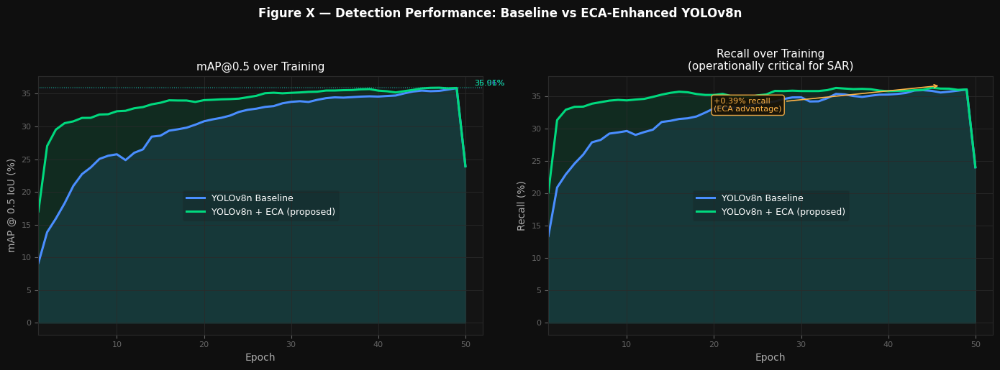

✅ Saved → /content/drive/MyDrive/Visdrone/map_recall_comparison.png


In [ ]:

# mAP comparison

fig, axes = plt.subplots(1, 2, figsize=(14, 5),
                          facecolor='#0f0f0f')
fig.suptitle(
    'Figure X — Detection Performance: Baseline vs ECA-Enhanced YOLOv8n',
    fontsize=12, fontweight='bold', color='white', y=1.02
)

# mAP@0.5
ax = axes[0]
b = df_base['metrics/mAP50(B)'].values * 100
e = df_eca['metrics/mAP50(B)'].values * 100
ax.fill_between(epochs_b, smooth(b), alpha=0.12, color=BASE_COL)
ax.fill_between(epochs_e, smooth(e), alpha=0.12, color=ECA_COL)
ax.plot(epochs_b, smooth(b), color=BASE_COL, linewidth=2.2,
        label='YOLOv8n Baseline')
ax.plot(epochs_e, smooth(e), color=ECA_COL,  linewidth=2.2,
        label='YOLOv8n + ECA (proposed)')
ax.axhline(b.max(), color=BASE_COL, linewidth=0.8,
           linestyle=':', alpha=0.5)
ax.axhline(e.max(), color=ECA_COL,  linewidth=0.8,
           linestyle=':', alpha=0.5)
ax.text(51, b.max() + 0.3, f'{b.max():.2f}%',
        color=BASE_COL, fontsize=8)
ax.text(51, e.max() + 0.3, f'{e.max():.2f}%',
        color=ECA_COL, fontsize=8)
ax.set_xlabel('Epoch', fontsize=10)
ax.set_ylabel('mAP @ 0.5 IoU (%)', fontsize=10)
ax.set_title('mAP@0.5 over Training', fontsize=11,
             color='white')
ax.legend(fontsize=9)
ax.grid(True)
ax.set_xlim([1, 52])

# Recall
ax = axes[1]
b = df_base['metrics/recall(B)'].values * 100
e = df_eca['metrics/recall(B)'].values * 100
ax.fill_between(epochs_b, smooth(b), alpha=0.12, color=BASE_COL)
ax.fill_between(epochs_e, smooth(e), alpha=0.12, color=ECA_COL)
ax.plot(epochs_b, smooth(b), color=BASE_COL, linewidth=2.2,
        label='YOLOv8n Baseline')
ax.plot(epochs_e, smooth(e), color=ECA_COL,  linewidth=2.2,
        label='YOLOv8n + ECA (proposed)')
ax.set_xlabel('Epoch', fontsize=10)
ax.set_ylabel('Recall (%)', fontsize=10)
ax.set_title('Recall over Training\n'
             '(operationally critical for SAR)',
             fontsize=11, color='white')
ax.legend(fontsize=9)
ax.grid(True)
ax.set_xlim([1, 52])

# ECA recall gain annotation
delta_r = e.max() - b.max()
ax.annotate(
    f'+{delta_r:.2f}% recall\n(ECA advantage)',
    xy=(df_eca['metrics/recall(B)'].idxmax() + 1,
        e.max() * 1.0),
    xytext=(20, e.max() - 4),
    fontsize=8, color='#ffb347',
    arrowprops=dict(arrowstyle='->', color='#ffb347',
                    lw=1.2),
    bbox=dict(boxstyle='round,pad=0.3',
              facecolor='#1a1204',
              edgecolor='#ffb347', alpha=0.9)
)

plt.tight_layout()
OUT2 = f'{DRIVE_BASE}/map_recall_comparison.png'
plt.savefig(OUT2, dpi=200, bbox_inches='tight',
            facecolor='#0f0f0f')
plt.show()
print(f" Saved → {OUT2}")

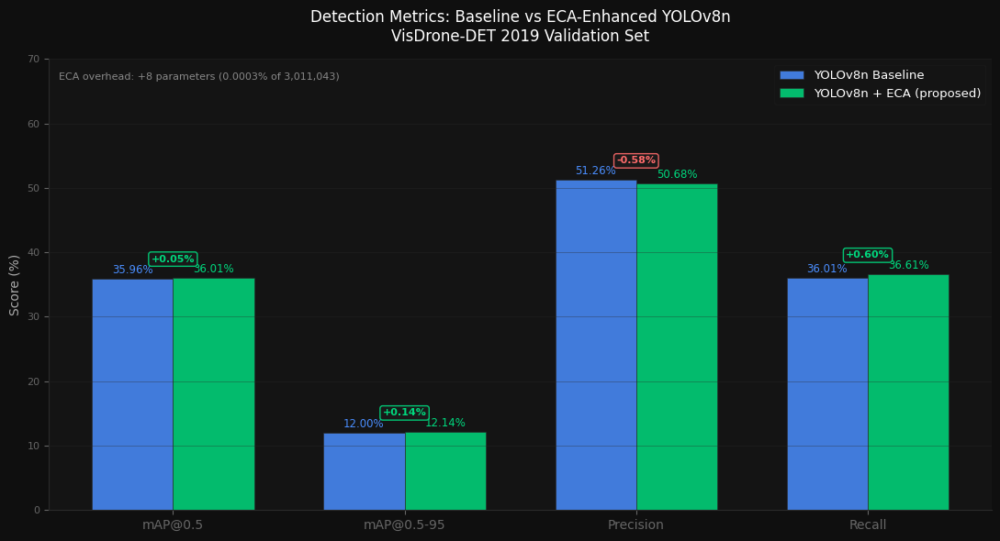

✅ Saved → /content/drive/MyDrive/Visdrone/metrics_bar_chart.png


In [ ]:
# ============================================================
# CELL 4 — Final results bar chart for thesis table figure
# ============================================================
import matplotlib.patches as mpatches

metrics = ['mAP@0.5', 'mAP@0.5-95', 'Precision', 'Recall']
baseline_vals = [35.96, 12.00, 51.26, 36.01]
eca_vals      = [36.01, 12.14, 50.68, 36.61]

x     = np.arange(len(metrics))
width = 0.35

fig, ax = plt.subplots(figsize=(11, 6),
                        facecolor='#0f0f0f')
fig.patch.set_facecolor('#0f0f0f')
ax.set_facecolor('#141414')

bars1 = ax.bar(x - width/2, baseline_vals, width,
               color=BASE_COL, alpha=0.85,
               label='YOLOv8n Baseline',
               edgecolor='#2a2a2a', linewidth=0.5)
bars2 = ax.bar(x + width/2, eca_vals, width,
               color=ECA_COL, alpha=0.85,
               label='YOLOv8n + ECA (proposed)',
               edgecolor='#2a2a2a', linewidth=0.5)

# Value labels on bars
for bar in bars1:
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + 0.4,
            f'{bar.get_height():.2f}%',
            ha='center', va='bottom',
            fontsize=8.5, color=BASE_COL)

for bar in bars2:
    ax.text(bar.get_x() + bar.get_width()/2,
            bar.get_height() + 0.4,
            f'{bar.get_height():.2f}%',
            ha='center', va='bottom',
            fontsize=8.5, color=ECA_COL)

# Delta annotations
for i, (b_v, e_v) in enumerate(zip(baseline_vals, eca_vals)):
    delta = e_v - b_v
    color = '#00d97e' if delta >= 0 else '#ff6b6b'
    sign  = '+' if delta >= 0 else ''
    ax.text(i, max(b_v, e_v) + 2.5,
            f'{sign}{delta:.2f}%',
            ha='center', fontsize=8,
            color=color, fontweight='bold',
            bbox=dict(boxstyle='round,pad=0.25',
                      facecolor='#1a1a1a',
                      edgecolor=color, alpha=0.9))

ax.set_title(
    'Detection Metrics: Baseline vs ECA-Enhanced YOLOv8n\n'
    'VisDrone-DET 2019 Validation Set',
    fontsize=12, color='white', pad=14
)
ax.set_ylabel('Score (%)', fontsize=10)
ax.set_xticks(x)
ax.set_xticklabels(metrics, fontsize=10)
ax.set_ylim([0, 70])
ax.legend(fontsize=9.5, loc='upper right')
ax.grid(True, axis='y', alpha=0.4)
ax.spines[['top','right']].set_visible(False)

# Parameter overhead note
ax.text(0.01, 0.97,
        'ECA overhead: +8 parameters (0.0003% of 3,011,043)',
        transform=ax.transAxes,
        fontsize=8, color='#888888',
        va='top')

plt.tight_layout()
OUT3 = f'{DRIVE_BASE}/metrics_bar_chart.png'
plt.savefig(OUT3, dpi=200, bbox_inches='tight',
            facecolor='#0f0f0f')
plt.show()
print(f" Saved → {OUT3}")

In [ ]:

#Summary: what was saved and where

import os
files = [
    'training_dashboard.png',
    'map_recall_comparison.png',
    'metrics_bar_chart.png',
]
print("\n Saved to Google Drive:\n")
for f in files:
    path = f'{DRIVE_BASE}/{f}'
    if os.path.exists(path):
        size = os.path.getsize(path) / 1e3
        print(f"  ✅  {f:<35} {size:.0f} KB")
    else:
        print(f"  ❌  {f} — not found")

print("\nDownload from Drive to include in your thesis.")


📁 Saved to Google Drive:

  ✅  training_dashboard.png              504 KB
  ✅  map_recall_comparison.png           168 KB
  ✅  metrics_bar_chart.png               119 KB

Download from Drive to include in your thesis.
